# IEP #2: Sensor Anomaly Detection

### **DATA LOADING & PREPROCESSING**

In [59]:
## Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [60]:
# Load dataset
df = pd.read_csv('engine_failure_dataset.csv', parse_dates=['Time_Stamp'])

# Set the timestamp as the index
df.set_index('Time_Stamp', inplace=True)

# Preview the data
df.head()

,Temperature (°C),RPM,Fuel_Efficiency,Vibration_X,Vibration_Y,Vibration_Z,Torque,Power_Output (kW),Fault_Condition,Operational_Mode
Time_Stamp,,,,,,,,,,
2024-12-24 10:00:00,60.308585,3426.827588,20.445472,0.874657,0.005686,0.529798,107.877659,23.367684,2,Idle
2024-12-24 10:05:00,112.705055,2949.758424,23.083947,0.696461,0.391779,0.124336,60.351655,57.941022,3,Cruising
2024-12-24 10:10:00,108.670976,1817.971040,20.555326,0.495276,0.189714,0.886417,110.986564,47.732998,2,Cruising
2024-12-24 10:15:00,107.114691,2730.660539,23.226431,0.986206,0.983202,0.468114,77.416793,44.112039,2,Cruising
2024-12-24 10:20:00,118.075814,1854.488677,21.148226,0.710810,0.101139,0.481034,100.475881,80.681972,2,Cruising


In [61]:
## Basic Exploration
print("The dataset has", df.shape[0],"rows and", df.shape[1], "columns")

The dataset has 1000 rows and 10 columns


In [62]:
#First and last 5 rows
df

,Temperature (°C),RPM,Fuel_Efficiency,Vibration_X,Vibration_Y,Vibration_Z,Torque,Power_Output (kW),Fault_Condition,Operational_Mode
Time_Stamp,,,,,,,,,,
2024-12-24 10:00:00,60.308585,3426.827588,20.445472,0.874657,0.005686,0.529798,107.877659,23.367684,2,Idle
2024-12-24 10:05:00,112.705055,2949.758424,23.083947,0.696461,0.391779,0.124336,60.351655,57.941022,3,Cruising
2024-12-24 10:10:00,108.670976,1817.971040,20.555326,0.495276,0.189714,0.886417,110.986564,47.732998,2,Cruising
2024-12-24 10:15:00,107.114691,2730.660539,23.226431,0.986206,0.983202,0.468114,77.416793,44.112039,2,Cruising
2024-12-24 10:20:00,118.075814,1854.488677,21.148226,0.710810,0.101139,0.481034,100.475881,80.681972,2,Cruising
...,...,...,...,...,...,...,...,...,...,...
2024-12-27 20:55:00,88.231211,1477.774501,23.749532,0.827987,0.664745,0.625331,178.466184,41.494154,3,Cruising
2024-12-27 21:00:00,105.241946,1617.745044,16.166110,0.753548,0.797969,0.618335,154.586204,52.987240,0,Cruising
2024-12-27 21:05:00,119.066775,2473.669785,17.657404,0.982960,0.699409,0.804165,164.138685,55.994142,3,Idle


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1000 entries, 2024-12-24 10:00:00 to 2024-12-27 21:15:00
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Temperature (°C)   1000 non-null   float64
 1   RPM                1000 non-null   float64
 2   Fuel_Efficiency    1000 non-null   float64
 3   Vibration_X        1000 non-null   float64
 4   Vibration_Y        1000 non-null   float64
 5   Vibration_Z        1000 non-null   float64
 6   Torque             1000 non-null   float64
 7   Power_Output (kW)  1000 non-null   float64
 8   Fault_Condition    1000 non-null   int64  
 9   Operational_Mode   1000 non-null   object 
dtypes: float64(8), int64(1), object(1)
memory usage: 85.9+ KB


In [64]:
#check percentage of missing values for each column
(df.isnull().sum().sort_values(ascending=False)/len(df))*100

Temperature (°C)     0.0
RPM                  0.0
Fuel_Efficiency      0.0
Vibration_X          0.0
Vibration_Y          0.0
Vibration_Z          0.0
Torque               0.0
Power_Output (kW)    0.0
Fault_Condition      0.0
Operational_Mode     0.0
dtype: float64

**EDA**

In [65]:
df.Fault_Condition.value_counts().apply(lambda x: f"{x} ({x / len(df) * 100:.2f}%)")

Fault_Condition
2    265 (26.50%)
0    258 (25.80%)
1    248 (24.80%)
3    229 (22.90%)
Name: count, dtype: object

### **DATA VISUALIZATION**

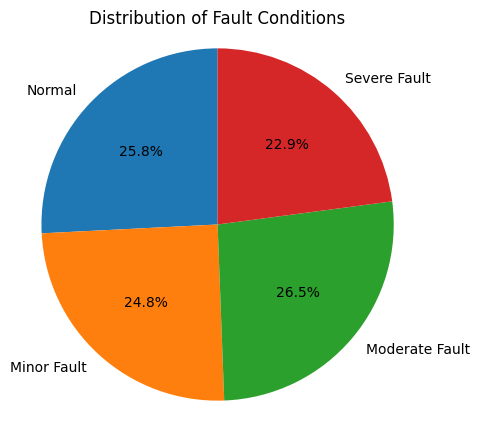

In [66]:
count_series = df.Fault_Condition.value_counts().sort_index()
percentages = count_series / len(df) * 100

# Fault condition mapping
fault_map = {
    0: "Normal",
    1: "Minor Fault",
    2: "Moderate Fault",
    3: "Severe Fault"
}

# Plot
labels = [f"{fault_map[idx]}" for idx in count_series.index]

plt.figure(figsize=(5, 5))
plt.pie(count_series, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Fault Conditions')
plt.axis('equal')
plt.show()

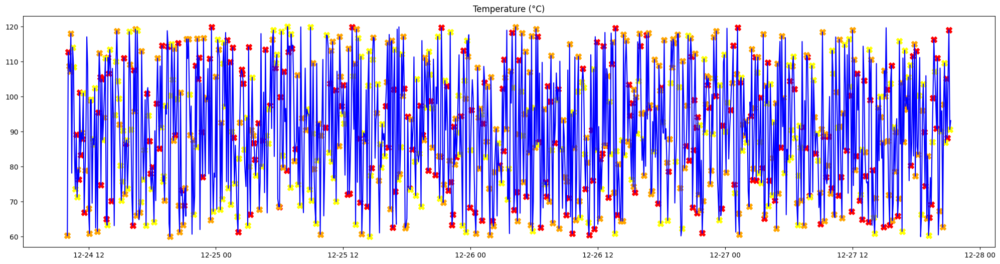

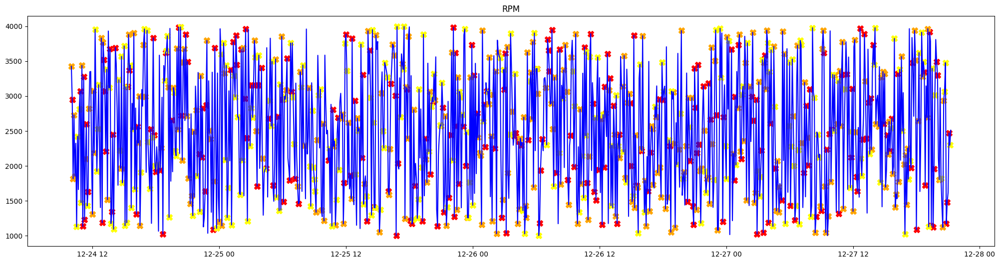

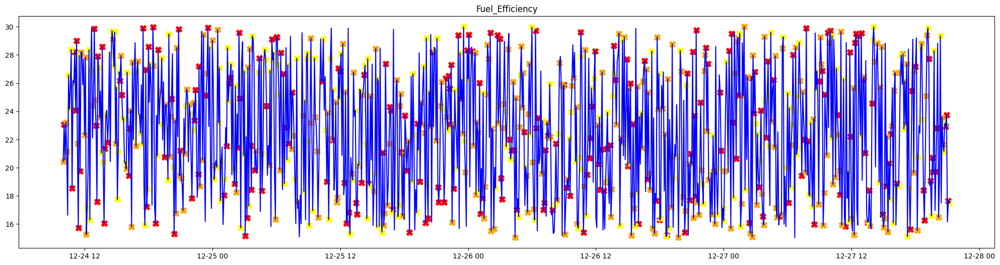

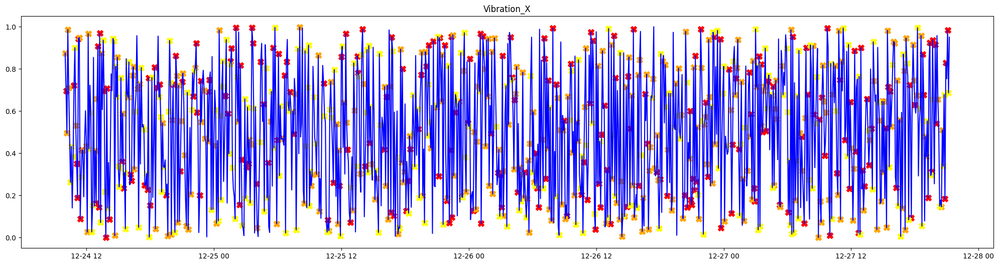

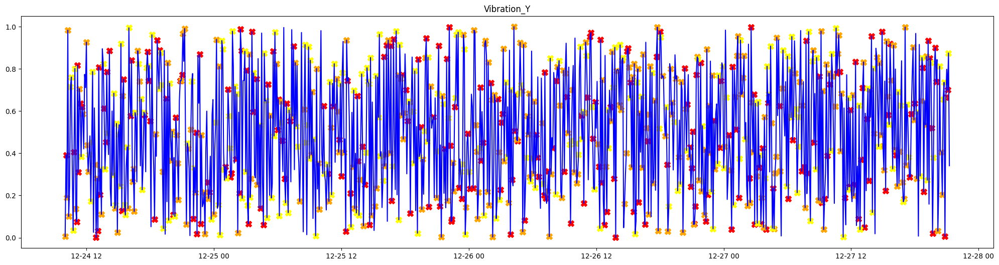

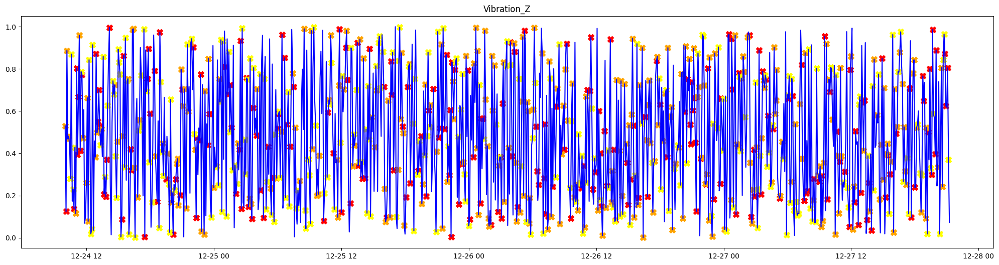

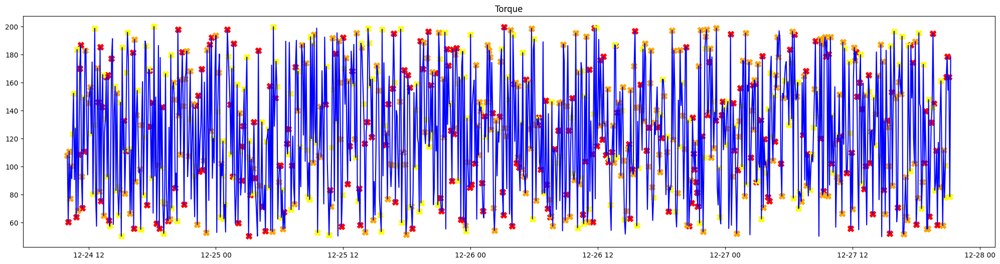

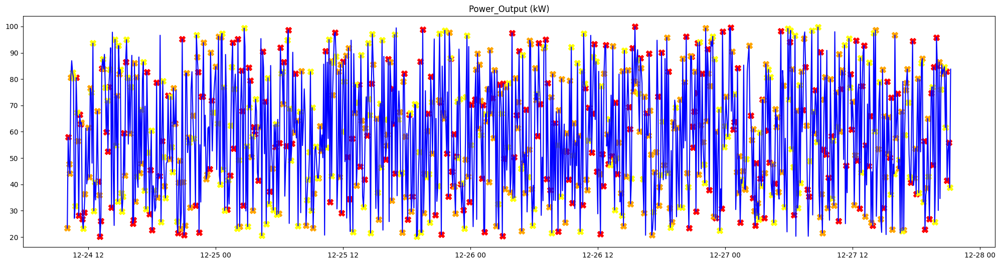

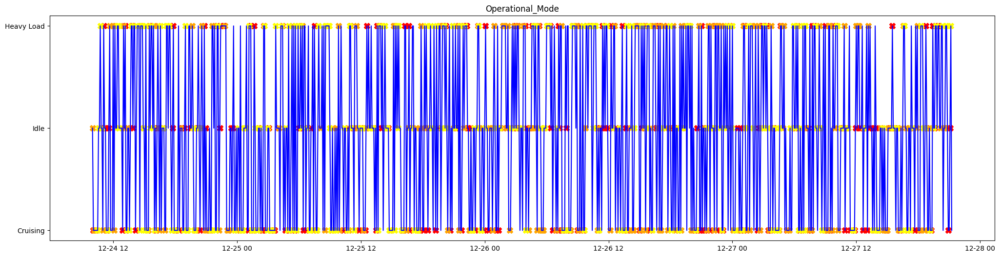

In [67]:
#extract the readings for severe faults
SevereFault= df[df['Fault_Condition']==3]
ModerateFault= df[df['Fault_Condition']==2]
MinorFault= df[df['Fault_Condition']==1]

#Extract the name of the numerical columns
df_wo_fault = df.drop(['Fault_Condition'],axis=1)
names= df_wo_fault.columns

#plot timeseries for each sensor with severe faults state marked with X in red color
for name in names:
    _=plt.figure(figsize=(25,6))
    _=plt.plot(SevereFault[name],linestyle='none',marker='X',color='red',markersize=8)
    _=plt.plot(ModerateFault[name],linestyle='none',marker='X',color='orange',markersize=8)
    _=plt.plot(MinorFault[name],linestyle='none',marker='X',color='yellow',markersize=8)
    _=plt.plot(df[name],color='blue')
    _=plt.title(name)
    plt.show()

### **DATA PRE-PROCESSING FOR ANOMALY DETECTION**

In [68]:
from sklearn.preprocessing import StandardScaler

In [69]:
# change the operational mode column to integer values 
mode_map = {
    'Idle': 1,
    'Cruising': 2,
    'Heavy Load': 3
}

df['Operational_Mode'] = df['Operational_Mode'].map(mode_map)

In [71]:
# Drop 'Fault_Condition' (target) 
# 'Operational_Mode' is already converted to numeric
df_features = df.drop(columns=['Fault_Condition'])

scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_features), index=df_features.index, columns=df_features.columns)
df_scaled

,Temperature (°C),RPM,Fuel_Efficiency,Vibration_X,Vibration_Y,Vibration_Z,Torque,Power_Output (kW),Operational_Mode
Time_Stamp,,,,,,,,,
2024-12-24 10:00:00,-1.750838,1.054660,-0.462546,1.270065,-1.767866,0.161848,-0.366098,-1.576714,-1.182082
2024-12-24 10:05:00,1.287264,0.504477,0.134298,0.664744,-0.393409,-1.244519,-1.474558,-0.041760,0.054405
2024-12-24 10:10:00,1.053356,-0.800765,-0.437697,-0.018666,-1.112743,1.398800,-0.293588,-0.494966,0.054405
2024-12-24 10:15:00,0.963118,0.251801,0.166529,1.648988,1.712006,-0.052107,-1.076543,-0.655726,0.054405
2024-12-24 10:20:00,1.598676,-0.758650,-0.303578,0.713487,-1.428062,-0.007294,-0.538731,0.967871,0.054405
...,...,...,...,...,...,...,...,...,...
2024-12-27 20:55:00,-0.131802,-1.193098,0.284858,1.111531,0.578327,0.493207,1.280255,-0.771952,0.054405
2024-12-27 21:00:00,0.854531,-1.031677,-1.430572,0.858665,1.052594,0.468942,0.723297,-0.261693,0.054405
2024-12-27 21:05:00,1.656135,-0.044576,-1.093230,1.637961,0.701729,1.113504,0.946092,-0.128196,-1.182082


In [73]:
true_fault_labels = df.loc[df.index.isin(df_scaled.index) & df['Fault_Condition'].isin([1, 2, 3]), 'Fault_Condition']
true_fault_labels

Time_Stamp
2024-12-24 10:00:00    2
2024-12-24 10:05:00    3
2024-12-24 10:10:00    2
2024-12-24 10:15:00    2
2024-12-24 10:20:00    2
                      ..
2024-12-27 20:45:00    1
2024-12-27 20:50:00    3
2024-12-27 20:55:00    3
2024-12-27 21:05:00    3
2024-12-27 21:10:00    1
Name: Fault_Condition, Length: 742, dtype: int64

### **ANOMALY DETECTION**

#### **Isolation Forest**

***Implementation***

In [111]:
from sklearn.ensemble import IsolationForest

# Train Isolation Forest on the scaled data (excluding normal data points)
iso_forest = IsolationForest(n_estimators=1000, contamination=0.5, max_features=1.0, random_state=42)
df_scaled['anomaly_score'] = iso_forest.fit_predict(df_scaled)

***Extract and Compare Results***

In [112]:
# Add results to the original dataframe
df_results = df_scaled.copy()
df_results['Fault_Condition'] = df.loc[df_scaled.index, 'Fault_Condition']

# Mark anomaly as 1, normal as 0
df_results['Anomaly_Detected'] = df_results['anomaly_score'].apply(lambda x: 1 if x == -1 else 0)

***Evaluation***

In [113]:
# Compare anomaly detection output with actual known faults
confusion = pd.crosstab(df_results['Fault_Condition'], df_results['Anomaly_Detected'],
                        rownames=['Actual Fault'], colnames=['Detected as Anomaly'])

print(confusion)


Detected as Anomaly    0    1
Actual Fault                 
0                    135  123
1                    126  122
2                    130  135
3                    109  120


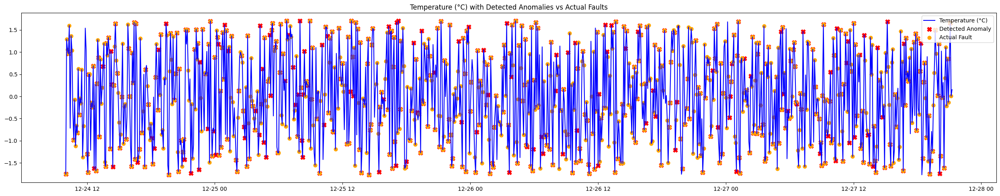

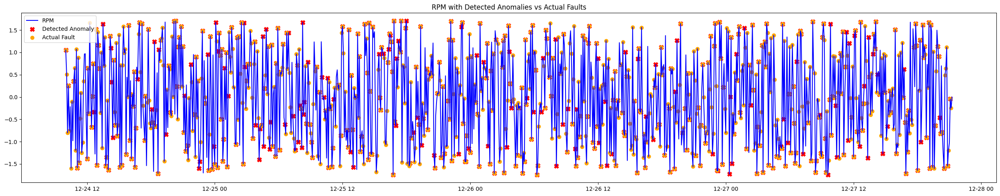

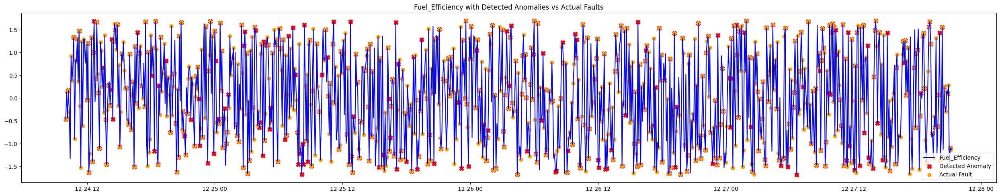

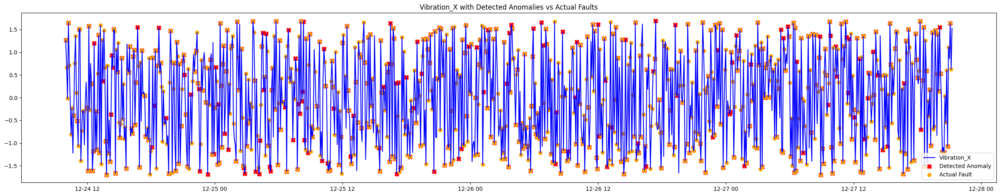

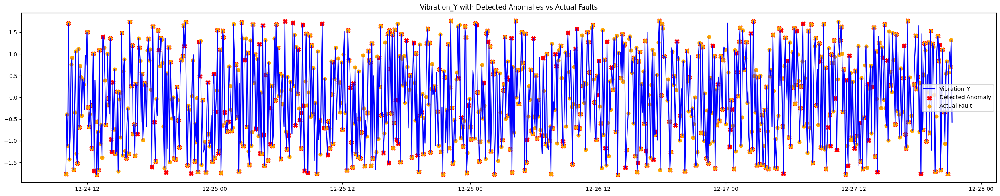

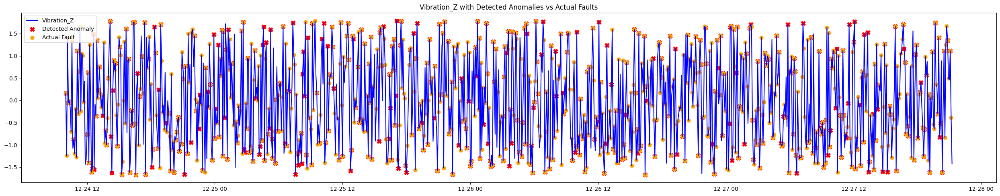

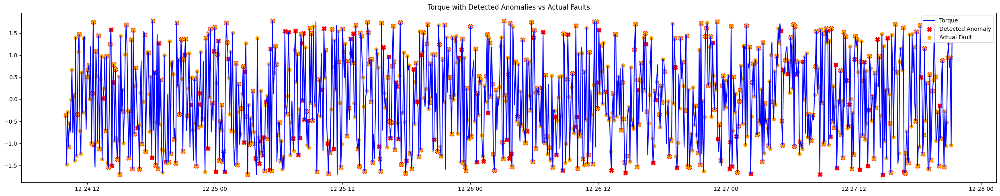

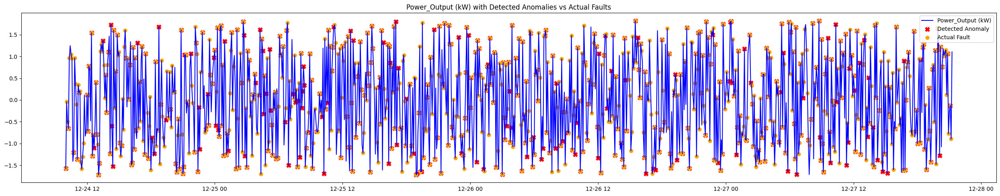

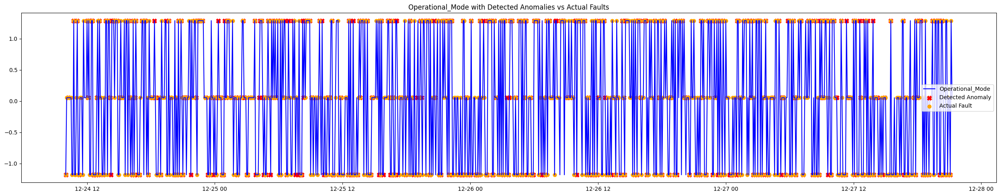

In [114]:
correctly_detected = 0
missed_faults = 0
false_positives = 0

for sensor in df_scaled.columns[:-1]:
    plt.figure(figsize=(25, 5))

    # Plot full sensor data
    plt.plot(df_scaled.index, df_scaled[sensor], label=sensor, color='blue')

    # Detected anomalies (red X)
    detected_anomalies = df_results[df_results['Anomaly_Detected'] == 1]
    plt.scatter(
        detected_anomalies.index,
        df_scaled.loc[detected_anomalies.index, sensor],
        color='red', marker='X', s=60, label='Detected Anomaly'
    )

    # Actual faults (orange o)
    actual_faults = df_results[df_results['Fault_Condition'].isin([1, 2, 3])]
    plt.scatter(
        actual_faults.index,
        df_scaled.loc[actual_faults.index, sensor],
        color='orange', marker='o', s=40, label='Actual Fault'
    )

    plt.title(f"{sensor} with Detected Anomalies vs Actual Faults")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [115]:
# Filter to only actual fault instances
true_faults = df_results[df_results['Fault_Condition'].isin([1, 2, 3])]

# Count how many actual faults were detected as anomalies
correctly_flagged = true_faults['Anomaly_Detected'].sum()
total_faults = len(true_faults)

print(f"Detected {correctly_flagged} out of {total_faults} actual fault instances.")

Detected 377 out of 742 actual fault instances.


In [116]:
from sklearn.metrics import classification_report

# Ground truth: 1 for faulty (1,2,3), 0 for normal (0)
ground_truth = df_results['Fault_Condition'].apply(lambda x: 1 if x in [1, 2, 3] else 0)

# Predicted: 1 if detected as anomaly, 0 otherwise
predicted = df_results['Anomaly_Detected']

# Print classification report
print(classification_report(ground_truth, predicted, target_names=['Normal', 'Fault']))


              precision    recall  f1-score   support

      Normal       0.27      0.52      0.36       258
       Fault       0.75      0.51      0.61       742

    accuracy                           0.51      1000
   macro avg       0.51      0.52      0.48      1000
weighted avg       0.63      0.51      0.54      1000



### **AUTOENCODER**

***Data Preparation***

In [117]:
# Use only normal data (Fault_Condition == 0) to train the model
df_normal = df[df['Fault_Condition'] == 0].drop(columns=['Fault_Condition'])
df_anomaly_test = df[df['Fault_Condition'].isin([1, 2, 3])].drop(columns=['Fault_Condition'])

# Scale all data
scaler = StandardScaler()
X_train = scaler.fit_transform(df_normal)
X_test = scaler.transform(df.drop(columns=['Fault_Condition']))

***Buil the Model***

In [118]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

input_dim = X_train.shape[1]

autoencoder = Sequential([
    Dense(64, activation='relu', input_shape=(input_dim,)),
    Dense(32, activation='relu'),
    Dense(64, activation='relu'),
    Dense(input_dim, activation='linear')
])

autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

/Users/adamtai/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/adamtai/Library/Python/3.9/lib/python/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


***Train the Model***

In [119]:
history = autoencoder.fit(
    X_train, X_train,
    epochs=50,
    batch_size=32,
    validation_split=0.1,
    verbose=1
)

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 1.0252 - val_loss: 0.9287
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9256 - val_loss: 0.8417
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8508 - val_loss: 0.7573
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7572 - val_loss: 0.6667
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6636 - val_loss: 0.5703
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5617 - val_loss: 0.4730
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4705 - val_loss: 0.3874
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3607 - val_loss: 0.3195
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2898 - val_loss: 0.2626
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2336 - val_loss: 0.2143
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1861 - val_loss: 0.1799
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1350 - val_loss: 0.1465
Epoch 13/50


***Compute Reconstruction Error***

In [120]:
import numpy as np

X_pred = autoencoder.predict(X_test)
reconstruction_error = np.mean(np.square(X_test - X_pred), axis=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


***Set Threshold and Classify Anomalies***

In [122]:
threshold = np.percentile(reconstruction_error, 95)  # or use ROC analysis

# 1 = anomaly, 0 = normal
autoencoder_anomalies = (reconstruction_error > threshold).astype(int)

***Evaluate Performance***

In [124]:
from sklearn.metrics import classification_report

y_true = df['Fault_Condition'].apply(lambda x: 1 if x in [1,2,3] else 0)
print(classification_report(y_true, autoencoder_anomalies))

              precision    recall  f1-score   support

           0       0.27      1.00      0.43       258
           1       0.98      0.07      0.12       742

    accuracy                           0.31      1000
   macro avg       0.63      0.53      0.27      1000
weighted avg       0.80      0.31      0.20      1000



***Here, we try to optimize the threshold of the reconstruction error to improve the performance of the model. That is shown in the below output metrics where the recall for faults improves from <u>7% to 90%</u>. The model was very conservative, calling nearly everything "normal", additionally, the high precision for faults was misleading as it barely caught any. After optimizing the model, we obtained a much better balance between detecting faults and avoiding false alarms with improvements in f1 score for faults from <u>12% to 88%</u> and overall accuracy from <u>31% to 81%</u>.***

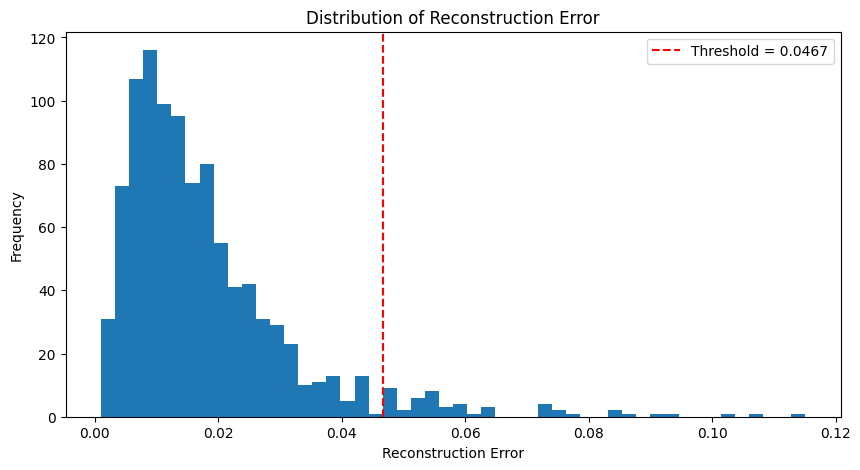

In [125]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.hist(reconstruction_error, bins=50)
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold:.4f}")
plt.title("Distribution of Reconstruction Error")
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.legend()
plt.show()


In [126]:
from sklearn.metrics import f1_score, precision_score, recall_score

def find_optimal_threshold(y_true, reconstruction_errors, metric='f1', verbose=True):
    thresholds = np.linspace(min(reconstruction_errors), max(reconstruction_errors), 200)
    best_threshold = None
    best_score = -1

    for t in thresholds:
        preds = (reconstruction_errors > t).astype(int)

        if metric == 'f1':
            score = f1_score(y_true, preds)
        elif metric == 'precision':
            score = precision_score(y_true, preds)
        elif metric == 'recall':
            score = recall_score(y_true, preds)
        else:
            raise ValueError("Invalid metric. Choose from 'f1', 'precision', or 'recall'.")

        if score > best_score:
            best_score = score
            best_threshold = t

    if verbose:
        print(f"✅ Best threshold: {best_threshold:.4f}")
        print(f"⭐ Best {metric} score: {best_score:.4f}")

    return best_threshold


In [127]:
# True labels: 1 = faulty, 0 = normal
y_true = df['Fault_Condition'].apply(lambda x: 1 if x in [1, 2, 3] else 0).values

# Find best threshold based on F1 score
optimal_threshold = find_optimal_threshold(y_true, reconstruction_error, metric='f1')

✅ Best threshold: 0.0079
⭐ Best f1 score: 0.8752


In [128]:
# Apply it
autoencoder_preds = (reconstruction_error > optimal_threshold).astype(int)

In [129]:
from sklearn.metrics import classification_report

y_true = df['Fault_Condition'].apply(lambda x: 1 if x in [1,2,3] else 0)
print(classification_report(y_true, autoencoder_preds))

              precision    recall  f1-score   support

           0       0.66      0.54      0.59       258
           1       0.85      0.90      0.88       742

    accuracy                           0.81      1000
   macro avg       0.75      0.72      0.73      1000
weighted avg       0.80      0.81      0.80      1000



***Visualize the anomalies detected versus all faults***

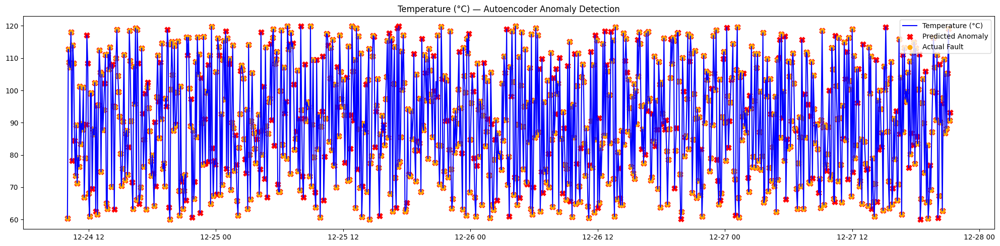

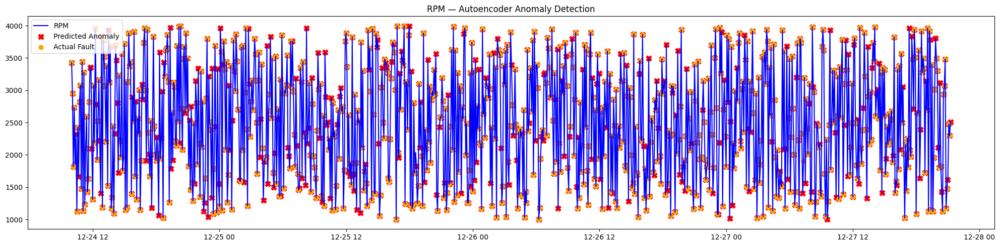

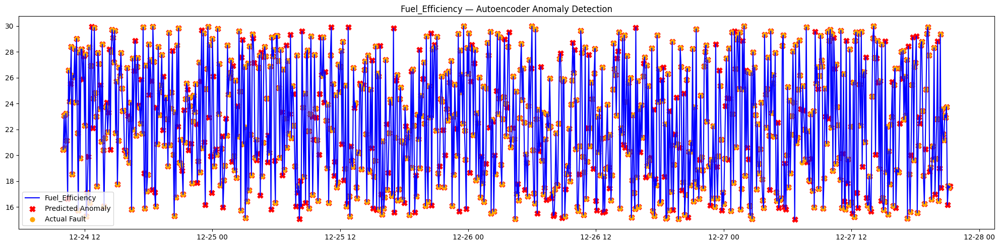

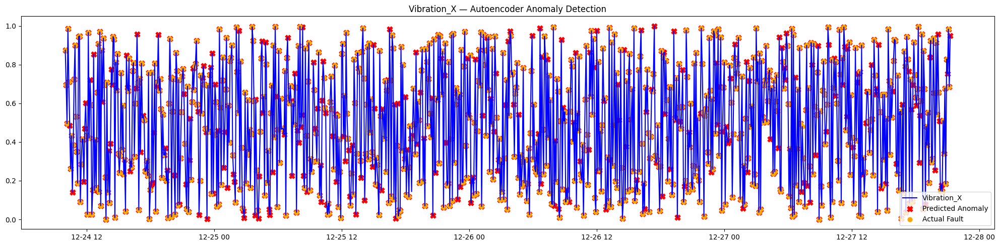

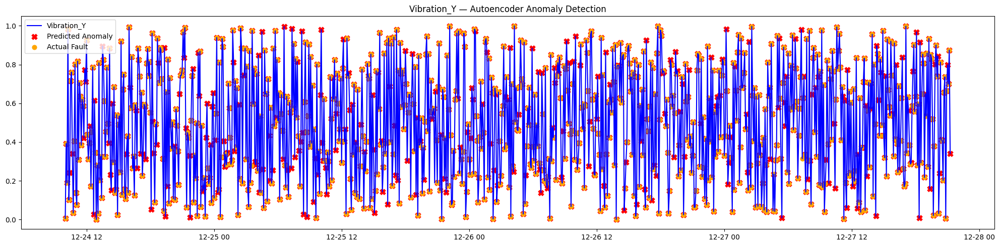

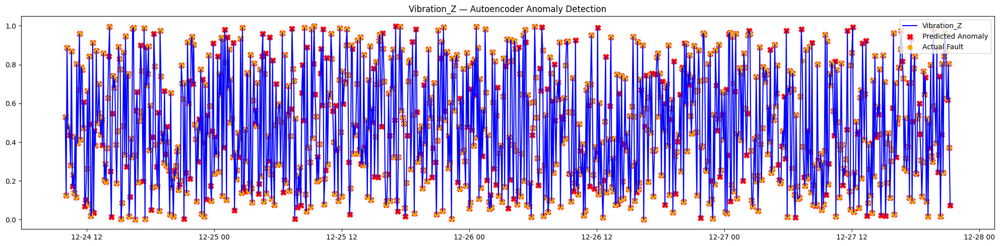

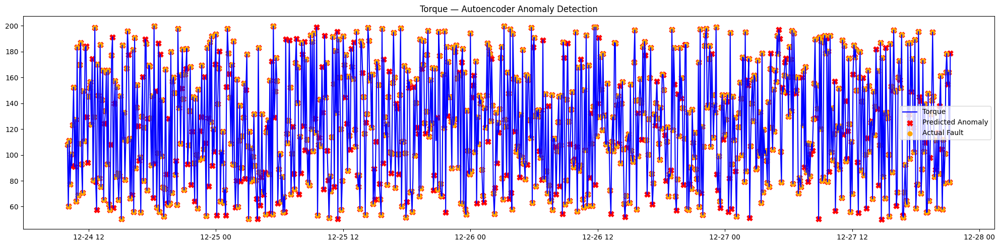

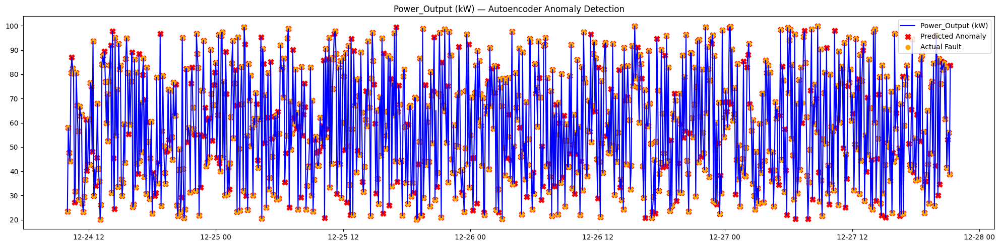

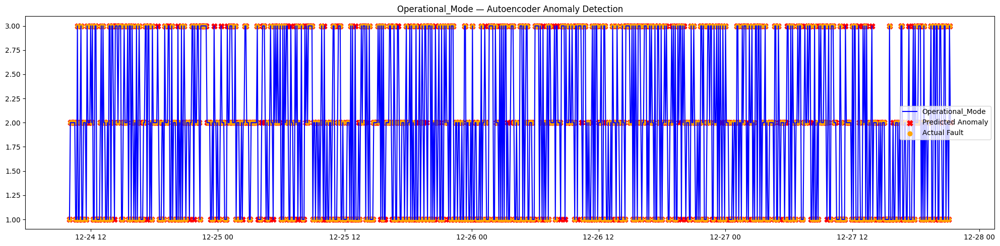

In [134]:
# Create a DataFrame for visualization
df_results = df.copy()
df_results['Anomaly_Predicted'] = autoencoder_preds
df_results['Reconstruction_Error'] = reconstruction_error

# Drop Fault_Condition for plotting columns
sensor_columns = df.drop(columns=['Fault_Condition']).columns

# Plot each sensor
for sensor in sensor_columns:
    plt.figure(figsize=(20, 5))

    # Full signal
    plt.plot(df_results.index, df_results[sensor], label=sensor, color='blue')

    # Predicted anomalies
    plt.scatter(
        df_results[df_results['Anomaly_Predicted'] == 1].index,
        df_results.loc[df_results['Anomaly_Predicted'] == 1, sensor],
        color='red', marker='X', s=60, label='Predicted Anomaly'
    )

    # Actual faults
    plt.scatter(
        df_results[df_results['Fault_Condition'].isin([1, 2, 3])].index,
        df_results.loc[df_results['Fault_Condition'].isin([1, 2, 3]), sensor],
        color='orange', marker='o', s=40, label='Actual Fault'
    )

    plt.title(f"{sensor} — Autoencoder Anomaly Detection")
    plt.legend()
    plt.tight_layout()
    plt.show()